# Reconstructor: VGGT-Omega

## Setup

In [1]:
import os
import sys
from pathlib import Path

import numpy as np
import torch
from PIL import Image
import matplotlib.pyplot as plt

# ── ensure project root is on sys.path and is the working directory ──────────
PROJECT_ROOT = Path("__file__").resolve().parent.parent
if not (PROJECT_ROOT / "config.yaml").exists():
    PROJECT_ROOT = Path("__file__").resolve().parent
os.chdir(PROJECT_ROOT)
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Project root : {PROJECT_ROOT}")
print(f"Using device : {device}")

Project root : /usr/prakt/s0034/AppliedFoundationModels
Using device : cuda


## Dataset config

### (Choose A): ScanNet scenes

In [4]:
# Point this at a downloaded ScanNet scene directory
SCENE_DIR  = "/storage/group/dataset_mirrors/scannet/scans/scene0010_00"
COLLECTION = "scannet_scene0010_00_vggt_debug"

# RGB-only input: natural order by frame index (same convention as ScanNet).
rgb_paths = sorted(
    (str(p) for p in Path(SCENE_DIR).glob("color/*.jpg")),
    key=lambda p: int(Path(p).stem),
)

### (Choose B): Self-made scenes uploaded via UI

In [ ]:
# Point this at a downloaded scene directory
SCENE_DIR = "data/scenes/house_of_eze"
COLLECTION = "house_of_eze_vggt_debug"

# RGB-only input: natural order by frame index (same convention as ScanNet).
rgb_paths = sorted(
    (str(p) for p in Path(SCENE_DIR).glob("rgb/*.jpg")),
    key=lambda p: int(Path(p).stem),
)

## Reconstruction

In [5]:
import yaml

from src.reconstruct import VGGTOmegaReconstructor

cfg = yaml.safe_load(Path("config.yaml").read_text())
vggt_cfg = cfg["models"]["vggt_omega"]
max_frames = int(vggt_cfg["max_frames"])

out_dir = Path("data/reconstruction") / COLLECTION
depth_dir = out_dir / "depth"

print(f"Scene      : {SCENE_DIR}")
print(f"Collection : {COLLECTION}")
print(f"Scene RGB  : {len(rgb_paths):,} frames on disk")
print(
    f"max_frames : {max_frames}  ← models.vggt_omega.max_frames in config.yaml "
    f"(THIS caps how many frames the reconstructor will use)"
)

print("Running VGGT-Omega reconstruction …")
rec = VGGTOmegaReconstructor.from_config("config.yaml")
fs = rec.reconstruct(rgb_paths, out_dir)

n = len(fs)
print(f"Depth dir  : {depth_dir}")
print(
    f"Frames used: {n:,}  "
    f"(predicted depth + cam-to-world pose written/returned per frame)"
)
print(
    f"Intrinsics : {fs.intrinsics}  "
    f"(AVERAGED over the predictions of the {n} frames used)"
)
print(
    f"depth_scale: {fs.depth_scale}  "
    f"← models.vggt_omega.depth_scale in config.yaml "
    + "(ARBITRARY for this pipeline — VGGT-Omega reconstruction is up-to-scale)"
)

Scene      : /storage/group/dataset_mirrors/scannet/scans/scene0010_00
Collection : scannet_scene0010_00_vggt_debug
Scene RGB  : 2,513 frames on disk
max_frames : 120  ← models.vggt_omega.max_frames in config.yaml (THIS caps how many frames the reconstructor will use)
Running VGGT-Omega reconstruction …
Depth dir  : data/reconstruction/scannet_scene0010_00_vggt_debug/depth
Frames used: 120  (predicted depth + cam-to-world pose written/returned per frame)
Intrinsics : {'fx': 545.1235961914062, 'fy': 544.1875, 'cx': 296.0, 'cy': 224.0}  (AVERAGED over the predictions of the 120 frames used)
depth_scale: 1000.0  ← models.vggt_omega.depth_scale in config.yaml (ARBITRARY for this pipeline — VGGT-Omega reconstruction is up-to-scale)


---
---
---

## (DEBUG) Visualize frames fed to VGGT-Omega

`fs.paths` are the RGB frames the reconstructor actually used (evenly spaced
subset of the scene, capped by `models.vggt_omega.max_frames`).

Visualizing 120 frames from FrameSet.paths …


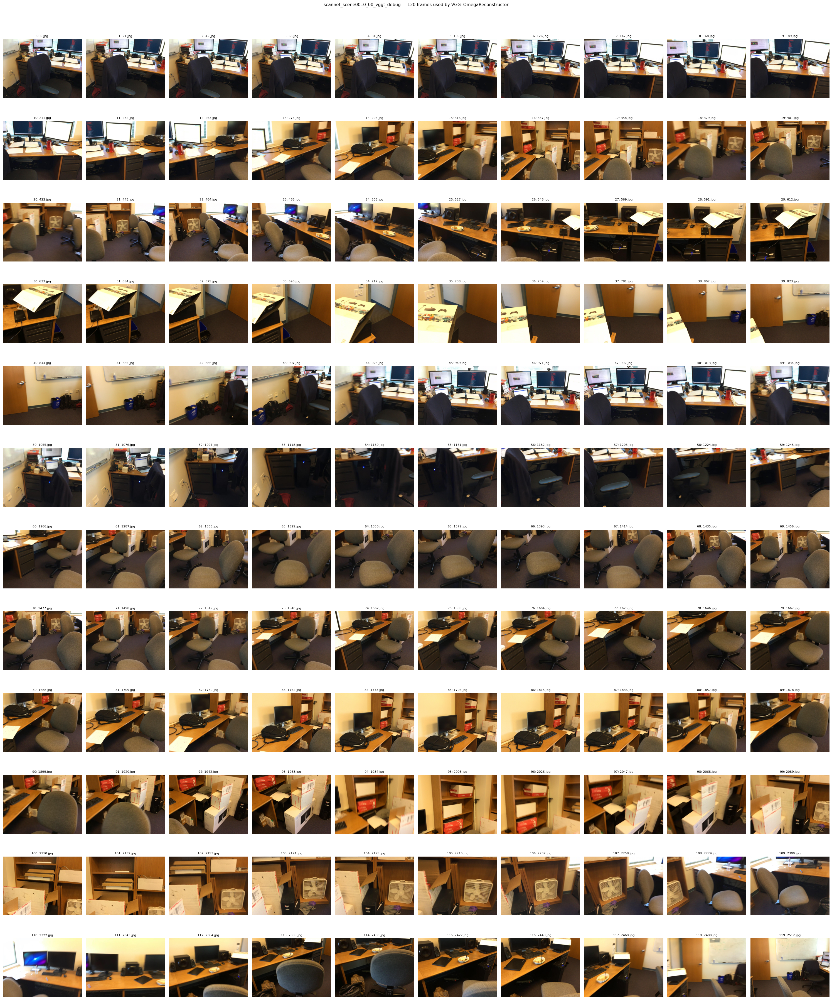

In [6]:
num_images = len(fs)
print(f"Visualizing {num_images} frames from FrameSet.paths …")

max_cols = 10
cols = min(num_images, max_cols)
rows = (num_images + max_cols - 1) // max_cols

fig, axes = plt.subplots(rows, cols, figsize=(3 * cols, 3 * rows), squeeze=False)
axes = axes.flatten()

for i, ax in enumerate(axes):
    if i < num_images:
        path = Path(fs.paths[i])
        ax.imshow(Image.open(path))
        ax.set_title(f"{i}: {path.name}", fontsize=8)
    ax.axis("off")

plt.suptitle(
    f"{COLLECTION}  ·  {num_images} frames used by VGGTOmegaReconstructor",
    fontsize=11,
    y=1.01,
)
plt.tight_layout()
plt.show()

---
---
---

## (DEBUG) Inspect one frame & choose proper confidence_threshold

Uses artefacts from the Reconstruction cell: `fs.paths[i]`,
`fs.depth_paths[i]`, and `out_dir/conf/{stem}.npy`. Depth is shown in scale predicted by VGGT-Omega (`raw / fs.depth_scale`). Filtered depth zeros pixels with
`confidence <= confidence_threshold`.


In [7]:
# Index into the reconstructed FrameSet (0 … len(fs)-1).
frame_idx = 10

In [8]:
# Pixels at or below this confidence are blanked in the filtered depth view.
# Default matches config.yaml → models.vggt_omega.confidence_threshold.
config_threshold = float(vggt_cfg["confidence_threshold"])
print(f"Config confidence_threshold = {config_threshold}")

# User may specify a higher threshold; otherwise use config default.
user_threshold = None  # <-- set this to your chosen threshold, or None

if user_threshold is not None and user_threshold > config_threshold:
    confidence_threshold = user_threshold
    print(
        f"User-specified confidence_threshold = {confidence_threshold} "
        f"(further filtering active; points with conf <= {confidence_threshold} removed)"
    )
else:
    confidence_threshold = config_threshold
    print(
        f"Using default/config confidence_threshold = {confidence_threshold} "
        f"(no additional filtering beyond FrameSet)"
    )

Config confidence_threshold = 3.0
Using default/config confidence_threshold = 3.0 (no additional filtering beyond FrameSet)


frame_idx=10  rgb=211.jpg  depth=00010.png
depth shape=(448, 592)  conf shape=(448, 592)  conf range=[1.03, 10.33]  depth range=[0.32, 0.71]
kept 238,055 / 265,216 pixels (89.8%) above threshold


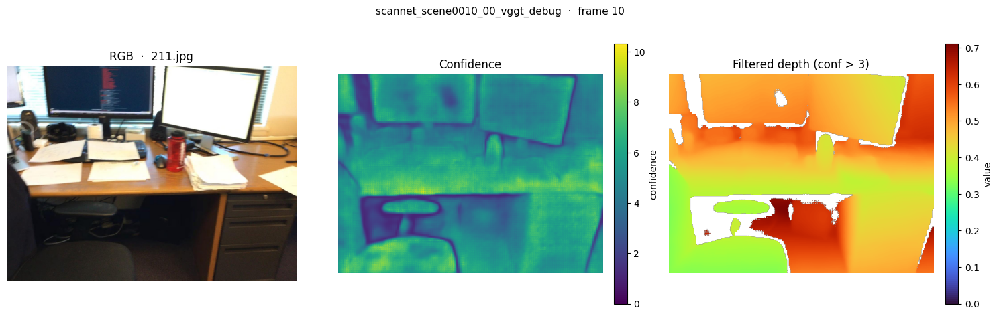

In [9]:
assert 0 <= frame_idx < len(fs), f"frame_idx={frame_idx} out of range [0, {len(fs)})"

rgb_path = Path(fs.paths[frame_idx])
depth_path = Path(fs.depth_paths[frame_idx])
conf_path = out_dir / "conf" / f"{depth_path.stem}.npy"

rgb = np.asarray(Image.open(rgb_path).convert("RGB"))
depth_val = np.asarray(Image.open(depth_path), dtype=np.float32) / float(fs.depth_scale)
conf = np.load(conf_path)

# Prepare the filtered depth (masking low-confidence)
conf_mask = conf > confidence_threshold
depth_filtered = np.where(conf_mask, depth_val, np.nan)

finite_mask = np.isfinite(depth_val) & (depth_val > 0)
if finite_mask.any():
    dmin = np.nanmin(depth_val[finite_mask])
    dmax = np.nanmax(depth_val[finite_mask])
else:
    dmin, dmax = float('nan'), 1.0

fig, axes = plt.subplots(1, 3, figsize=(15, 4.5))

# 1. RGB
axes[0].imshow(rgb)
axes[0].set_title(f"RGB  ·  {rgb_path.name}")
axes[0].axis("off")

# 2. Confidence
im_conf = axes[1].imshow(conf, cmap="viridis", vmin=0, vmax=conf.max())
axes[1].set_title("Confidence")
axes[1].axis("off")
fig.colorbar(im_conf, ax=axes[1], fraction=0.046, pad=0.04, label="confidence")

# 3. Filtered depth (in arbitrary VGGT-Omega space)
im2 = axes[2].imshow(depth_filtered, cmap="turbo", vmin=0, vmax=dmax)
axes[2].set_title(f"Filtered depth (conf > {confidence_threshold:g})")
axes[2].axis("off")
fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04, label="value")

kept = int(conf_mask.sum())

print(
    f"frame_idx={frame_idx}  rgb={rgb_path.name}  depth={depth_path.name}\n"
    f"depth shape={depth_val.shape}  conf shape={conf.shape}  "
    f"conf range=[{conf.min():.2f}, {conf.max():.2f}]  "
    f"depth range=[{dmin:.2f}, {dmax:.2f}]\n"
    f"kept {kept:,} / {conf.size:,} pixels "
    f"({100.0 * kept / conf.size:.1f}%) above threshold"
)
plt.suptitle(f"{COLLECTION}  ·  frame {frame_idx}", fontsize=11, y=1.02)
plt.tight_layout()
plt.show()